# Q2. Image Smoothing

This notebook performs image smoothing and noise analysis using two grayscale images:

- **Image 1:** Contains fine details and is corrupted with salt-and-pepper noise.
- **Image 2:** Contains relatively large smooth regions and is corrupted with Gaussian noise.

The following filters are compared:

1. Box filter
2. Weighted-average filter
3. Gaussian filter
4. Median filter

The notebook also:
- Tests at least three kernel sizes.
- Calculates MSE and PSNR.
- Displays absolute-difference images.
- Creates a mixed-noise image.
- Implements region-wise smoothing.
- Tabulates and discusses the results.

**Requirement satisfied:** The Box filter and Weighted-average filter are implemented manually without directly using a built-in filtering function.


## Required Libraries

If needed, install:

```bash
pip install numpy matplotlib pandas opencv-python scikit-image
```


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import time

from skimage import data, color

np.random.seed(42)

# 1. Select Two Grayscale Images

- `camera` contains fine structures and edges.
- `moon` contains comparatively large smooth regions.

Both images are standard grayscale images from `scikit-image`.


Fine-detail image shape: (512, 512)
Smooth-region image shape: (512, 512)


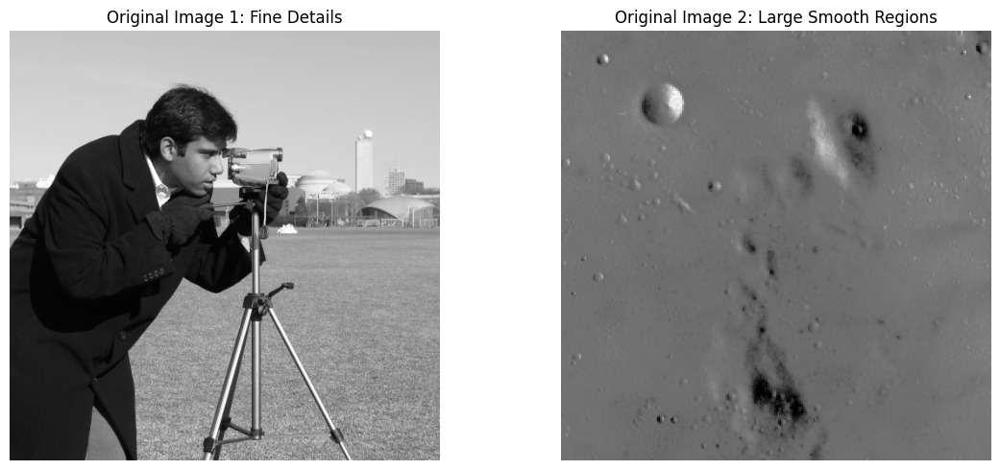

In [3]:
fine_image = data.camera().astype(np.float64)
smooth_image = data.moon().astype(np.float64)

print("Fine-detail image shape:", fine_image.shape)
print("Smooth-region image shape:", smooth_image.shape)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(fine_image, cmap="gray", vmin=0, vmax=255)
plt.title("Original Image 1: Fine Details")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(smooth_image, cmap="gray", vmin=0, vmax=255)
plt.title("Original Image 2: Large Smooth Regions")
plt.axis("off")

plt.tight_layout()
plt.show()

# 2. Add Noise

## Salt-and-Pepper Noise

Salt-and-pepper noise randomly changes pixels to black (`0`) or white (`255`).

## Gaussian Noise

Gaussian noise adds random values drawn from a normal distribution:

$$
N \sim \mathcal{N}(0, \sigma^2)
$$


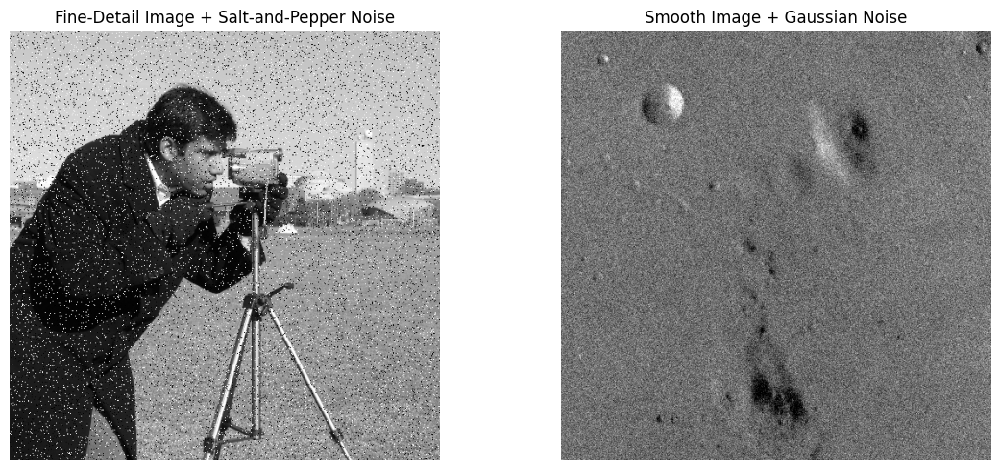

In [4]:
def add_salt_pepper_noise(image, amount=0.08, salt_vs_pepper=0.5):
    noisy = image.copy()

    total_pixels = image.size
    number_noisy = int(amount * total_pixels)

    # Salt pixels
    number_salt = int(number_noisy * salt_vs_pepper)

    salt_coords = (
        np.random.randint(0, image.shape[0], number_salt),
        np.random.randint(0, image.shape[1], number_salt)
    )

    noisy[salt_coords] = 255

    # Pepper pixels
    number_pepper = number_noisy - number_salt

    pepper_coords = (
        np.random.randint(0, image.shape[0], number_pepper),
        np.random.randint(0, image.shape[1], number_pepper)
    )

    noisy[pepper_coords] = 0

    return noisy


def add_gaussian_noise(image, sigma=25):
    noise = np.random.normal(0, sigma, image.shape)
    noisy = image + noise

    return np.clip(noisy, 0, 255)


sp_noisy = add_salt_pepper_noise(fine_image, amount=0.08)
gaussian_noisy = add_gaussian_noise(smooth_image, sigma=25)


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(sp_noisy, cmap="gray", vmin=0, vmax=255)
plt.title("Fine-Detail Image + Salt-and-Pepper Noise")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gaussian_noisy, cmap="gray", vmin=0, vmax=255)
plt.title("Smooth Image + Gaussian Noise")
plt.axis("off")

plt.tight_layout()
plt.show()

## 3. Box Filter

The box kernel is created using a matrix of ones and. The kernel is then applied to the image using 2D convolution.

For example, for a \(3\times3\) filter:

$$
K =
\frac{1}{9}
\begin{bmatrix}
1&1&1\\
1&1&1\\
1&1&1
\end{bmatrix}
$$

This gives equal weight to all pixels in the neighbourhood.


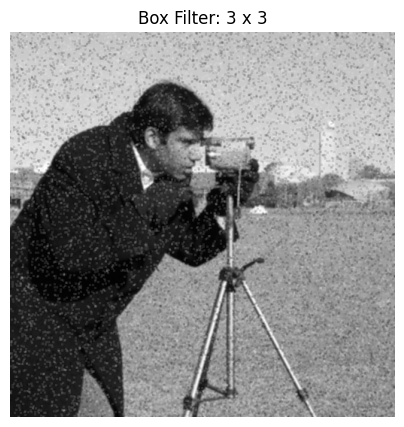

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

def box_filter(image, kernel_size):

    # Kernel size must be odd
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be odd.")

    # Create normalized box kernel
    kernel = np.ones((kernel_size, kernel_size), dtype=np.float64)
    kernel /= kernel_size ** 2

    # Apply kernel using convolution
    filtered = convolve2d(
        image,
        kernel,
        mode="same",
        boundary="symm"
    )

    return filtered


# Small test
box_test = box_filter(sp_noisy, 3)

plt.figure(figsize=(5, 5))
plt.imshow(box_test, cmap="gray", vmin=0, vmax=255)
plt.title("Box Filter: 3 x 3")
plt.axis("off")
plt.show()

# 4. Weighted-Average Filter

A weighted-average filter gives greater importance to nearby pixels, especially the centre pixel.

A commonly used $3 \times 3$ Gaussian-weighted kernel is:

$$
K = \frac{1}{16}
\begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$

The filtered pixel is obtained by multiplying the kernel element-wise with the corresponding $3 \times 3$ neighbourhood and summing the results:

$$
I_f(x,y) =
\sum_{i=-1}^{1}
\sum_{j=-1}^{1}
K(i,j)I(x+i,y+j)
$$

The centre pixel has the highest weight $(4/16)$, while the corner pixels have the lowest weight $(1/16)$.

This provides smoother results while generally preserving edges better than a uniform Box filter.

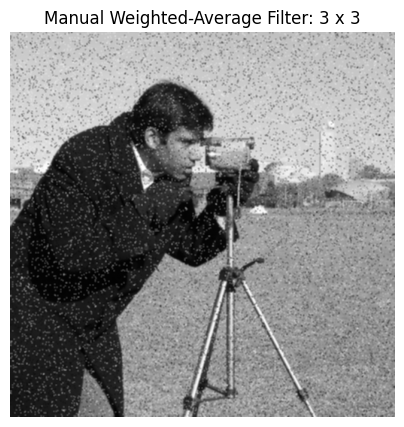

In [6]:
def create_weighted_kernel(kernel_size):

    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be odd.")

    radius = kernel_size // 2

    x = np.arange(-radius, radius + 1)
    X, Y = np.meshgrid(x, x)

    # Weighted-average kernel:
    # centre pixels receive larger weights
    sigma = max(kernel_size / 3, 1)

    kernel = np.exp(
        -(X**2 + Y**2) / (2 * sigma**2)
    )

    kernel = kernel / np.sum(kernel)

    return kernel


def manual_weighted_average_filter(image, kernel_size):

    kernel = create_weighted_kernel(kernel_size)
    radius = kernel_size // 2

    padded = np.pad(
        image,
        ((radius, radius), (radius, radius)),
        mode="reflect"
    )

    filtered = np.zeros_like(image, dtype=np.float64)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):

            region = padded[
                i:i + kernel_size,
                j:j + kernel_size
            ]

            filtered[i, j] = np.sum(region * kernel)

    return filtered


weighted_test = manual_weighted_average_filter(sp_noisy, 3)

plt.figure(figsize=(5, 5))
plt.imshow(weighted_test, cmap="gray", vmin=0, vmax=255)
plt.title("Manual Weighted-Average Filter: 3 x 3")
plt.axis("off")
plt.show()

# 5. Gaussian and Median Filters

The remaining filters use OpenCV.

## Gaussian Filter

Gaussian smoothing gives larger weights to nearby pixels:

$$
G(x,y) =
\frac{1}{2\pi\sigma^2}
e^{-\frac{x^2+y^2}{2\sigma^2}}
$$

## Median Filter

The median filter replaces a pixel with the median value of its local neighbourhood. It is particularly effective for salt-and-pepper noise.


In [7]:
def gaussian_filter(image, kernel_size, sigma=None):

    if sigma is None:
        sigma = 0

    return cv2.GaussianBlur(
        image.astype(np.float32),
        (kernel_size, kernel_size),
        sigmaX=sigma,
        sigmaY=sigma,
        borderType=cv2.BORDER_REFLECT
    ).astype(np.float64)


def median_filter(image, kernel_size):

    # OpenCV medianBlur requires uint8
    image_uint8 = np.clip(image, 0, 255).astype(np.uint8)

    return cv2.medianBlur(
        image_uint8,
        kernel_size
    ).astype(np.float64)

# 6. Apply All Four Filters Using Three Kernel Sizes

The kernel sizes tested are:

- $3 \times 3$
- $5 \times 5$
- $7 \times 7$

Increasing kernel size generally improves smoothing but can increase detail loss and blurring.


In [9]:
kernel_sizes = [3, 5, 7]


def apply_all_filters(image, kernel_sizes):

    results = {}

    for k in kernel_sizes:

        results[("Box", k)] = box_filter(image, k)

        results[("Weighted Average", k)] = (
            manual_weighted_average_filter(image, k)
        )

        results[("Gaussian", k)] = gaussian_filter(image, k)

        results[("Median", k)] = median_filter(image, k)

    return results


sp_filtered = apply_all_filters(sp_noisy, kernel_sizes)
gaussian_filtered = apply_all_filters(gaussian_noisy, kernel_sizes)

# 7. Visual Comparison for Salt-and-Pepper Noise

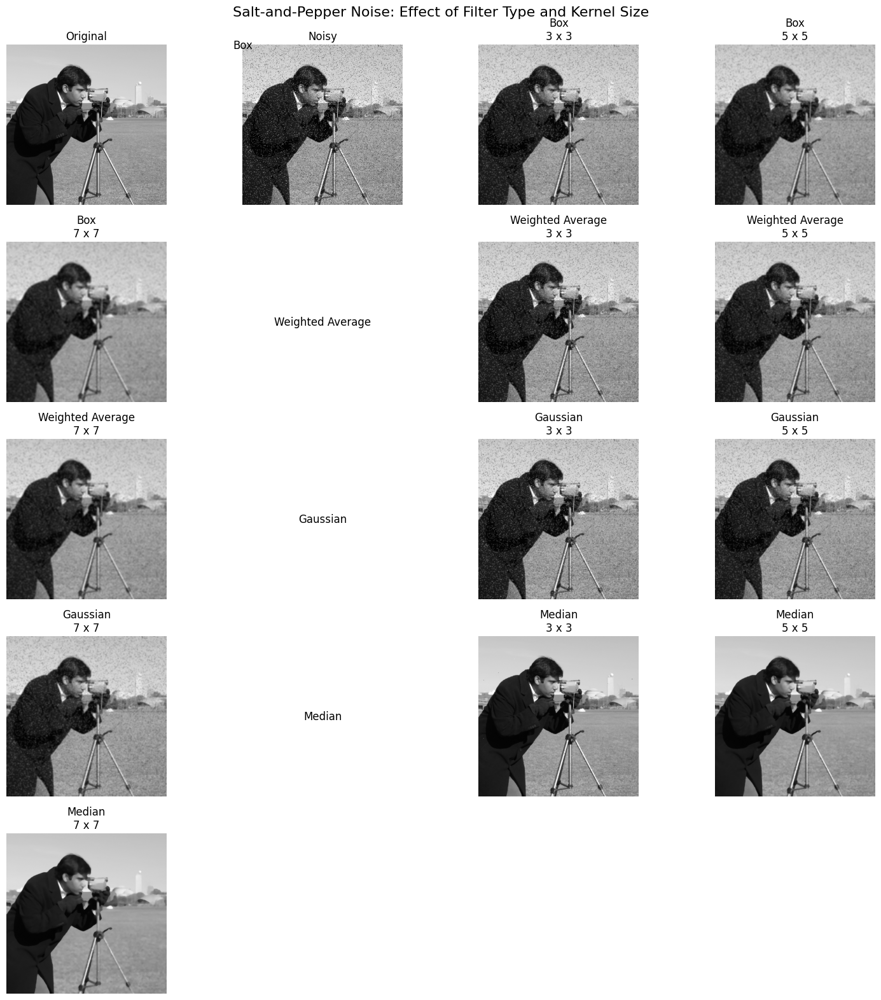

In [10]:
plt.figure(figsize=(15, 16))

# Row 1
plt.subplot(5, 4, 1)
plt.imshow(fine_image, cmap="gray", vmin=0, vmax=255)
plt.title("Original")
plt.axis("off")

plt.subplot(5, 4, 2)
plt.imshow(sp_noisy, cmap="gray", vmin=0, vmax=255)
plt.title("Noisy")
plt.axis("off")


positions = {
    "Box": 5,
    "Weighted Average": 9,
    "Gaussian": 13,
    "Median": 17
}

for method, start_pos in positions.items():

    # First column: method name
    plt.subplot(5, 4, start_pos - 3)
    plt.text(0.5, 0.5, method, ha="center", va="center", fontsize=12)
    plt.axis("off")

    # Remaining 3 columns: filtered images
    for index, k in enumerate(kernel_sizes):
        plt.subplot(5, 4, start_pos - 2 + index)

        plt.imshow(
            sp_filtered[(method, k)],
            cmap="gray",
            vmin=0,
            vmax=255
        )

        plt.title(f"{method}\n{k} x {k}")
        plt.axis("off")


plt.suptitle(
    "Salt-and-Pepper Noise: Effect of Filter Type and Kernel Size",
    fontsize=16
)

plt.tight_layout()
plt.show()

## Alternative Clear Visualization for Salt-and-Pepper Noise

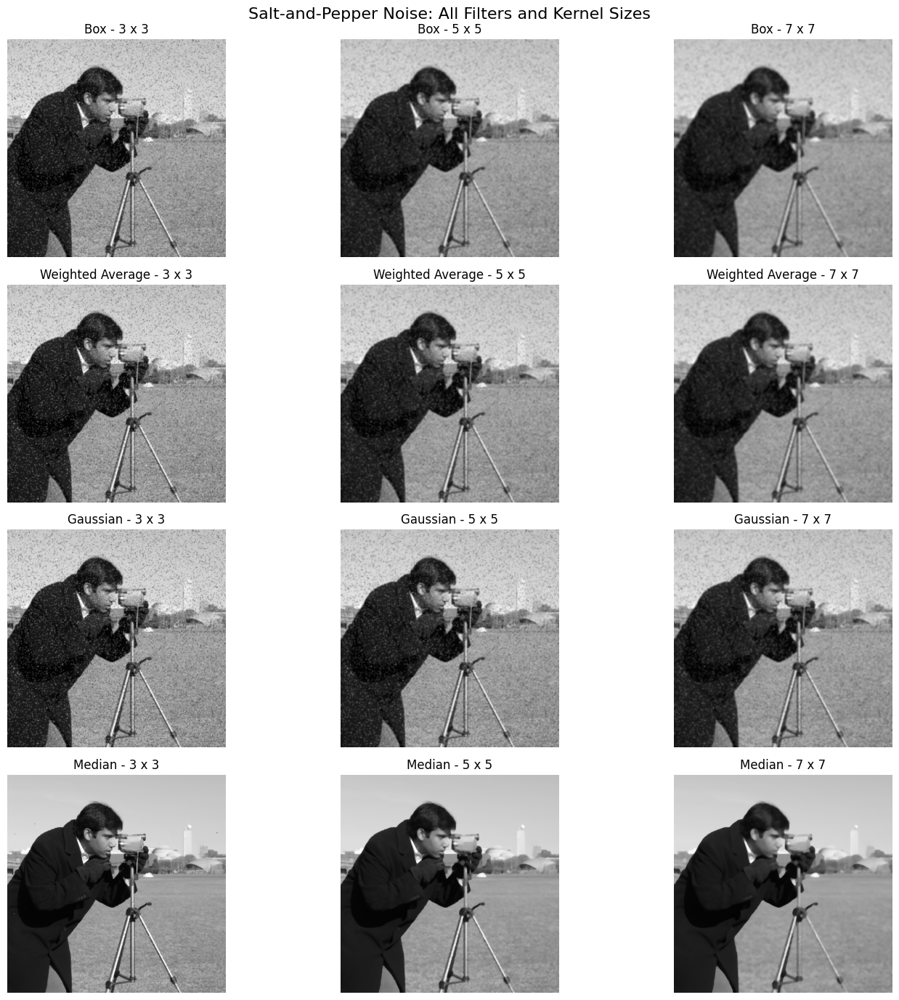

In [11]:
methods = ["Box", "Weighted Average", "Gaussian", "Median"]

plt.figure(figsize=(15, 14))

for row, method in enumerate(methods):

    for col, k in enumerate(kernel_sizes):

        position = row * len(kernel_sizes) + col + 1

        plt.subplot(len(methods), len(kernel_sizes), position)
        plt.imshow(
            sp_filtered[(method, k)],
            cmap="gray",
            vmin=0,
            vmax=255
        )
        plt.title(f"{method} - {k} x {k}")
        plt.axis("off")

plt.suptitle(
    "Salt-and-Pepper Noise: All Filters and Kernel Sizes",
    fontsize=16
)

plt.tight_layout()
plt.show()

# 8. Visual Comparison for Gaussian Noise

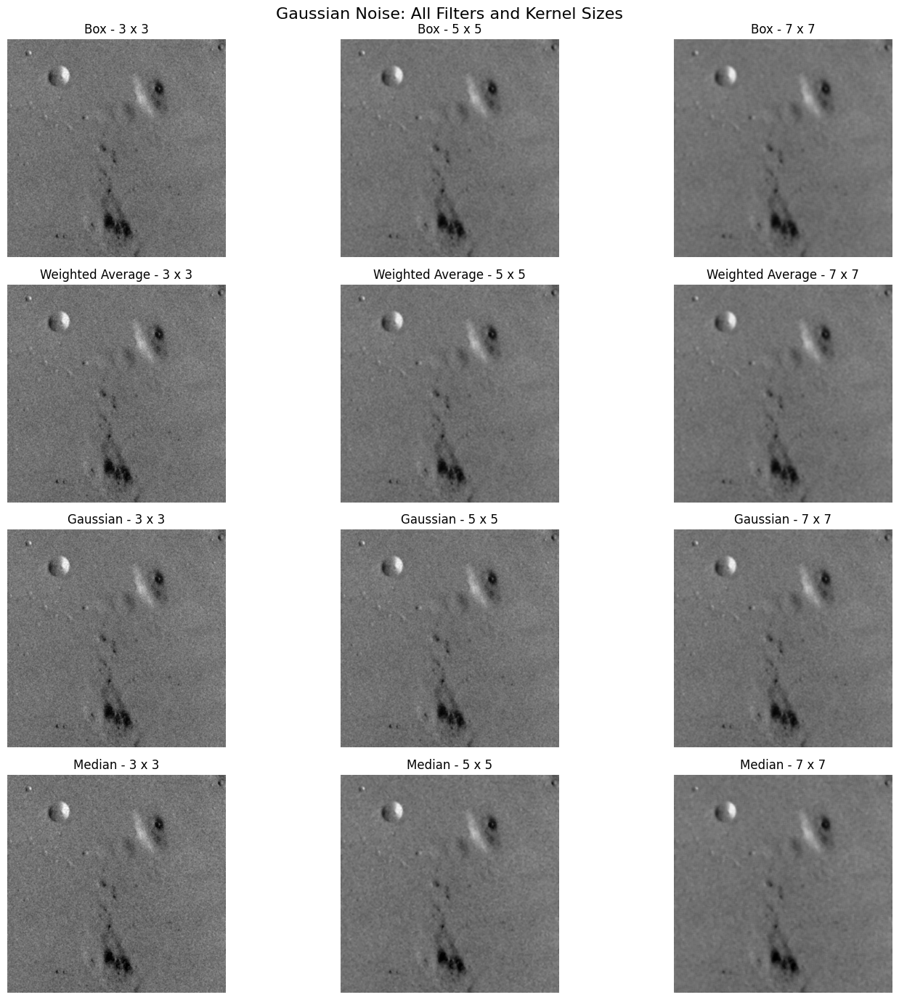

In [12]:
plt.figure(figsize=(15, 14))

for row, method in enumerate(methods):

    for col, k in enumerate(kernel_sizes):

        position = row * len(kernel_sizes) + col + 1

        plt.subplot(len(methods), len(kernel_sizes), position)
        plt.imshow(
            gaussian_filtered[(method, k)],
            cmap="gray",
            vmin=0,
            vmax=255
        )
        plt.title(f"{method} - {k} x {k}")
        plt.axis("off")

plt.suptitle(
    "Gaussian Noise: All Filters and Kernel Sizes",
    fontsize=16
)

plt.tight_layout()
plt.show()

# 9. MSE and PSNR

Mean Squared Error:

$$
MSE =
\frac{1}{MN}
\sum_{x=1}^{M}
\sum_{y=1}^{N}
[I(x,y)-I_f(x,y)]^2
$$

Peak Signal-to-Noise Ratio:

$$
PSNR =
10 \log_{10}
\left(
\frac{255^2}{MSE}
\right)
$$

The original noise-free image is used as the reference.


In [13]:
def calculate_mse(original, filtered):
    return np.mean((original - filtered) ** 2)


def calculate_psnr(original, filtered):
    mse = calculate_mse(original, filtered)

    if mse == 0:
        return float("inf")

    return 10 * np.log10((255 ** 2) / mse)


results = []

for noise_type, original, filtered_dict in [
    ("Salt-and-Pepper", fine_image, sp_filtered),
    ("Gaussian", smooth_image, gaussian_filtered)
]:

    for (method, kernel_size), filtered_image in filtered_dict.items():

        mse = calculate_mse(original, filtered_image)
        psnr = calculate_psnr(original, filtered_image)

        results.append({
            "Noise Type": noise_type,
            "Filter": method,
            "Kernel Size": f"{kernel_size} x {kernel_size}",
            "MSE": mse,
            "PSNR (dB)": psnr
        })


try:
    import pandas as pd
    results_df = pd.DataFrame(results)
    display(results_df)
except Exception:
    print("Pandas could not be loaded. Printing results:")
    for row in results:
        print(row)

,Noise Type,Filter,Kernel Size,MSE,PSNR (dB)
0,Salt-and-Pepper,Box,3 x 3,291.285962,23.487608
1,Salt-and-Pepper,Weighted Average,3 x 3,296.308005,23.413370
2,Salt-and-Pepper,Gaussian,3 x 3,313.457296,23.169020
3,Salt-and-Pepper,Median,3 x 3,68.316933,29.785520
4,Salt-and-Pepper,Box,5 x 5,241.351470,24.304304
5,Salt-and-Pepper,Weighted Average,5 x 5,222.608148,24.655393
6,Salt-and-Pepper,Gaussian,5 x 5,236.013441,24.401436
7,Salt-and-Pepper,Median,5 x 5,108.951633,27.758466
8,Salt-and-Pepper,Box,7 x 7,273.977966,23.753647
9,Salt-and-Pepper,Weighted Average,7 x 7,237.994451,24.365135


# 10. Absolute-Difference Images

The absolute-difference image shows the information removed or changed by a filter:

$$
D(x,y) =
|I(x,y)-I_f(x,y)|
$$

where:
- $I(x,y)$ is the noisy image.
- $I_f(x,y)$ is the filtered image.

Bright regions represent larger changes made by the smoothing filter.


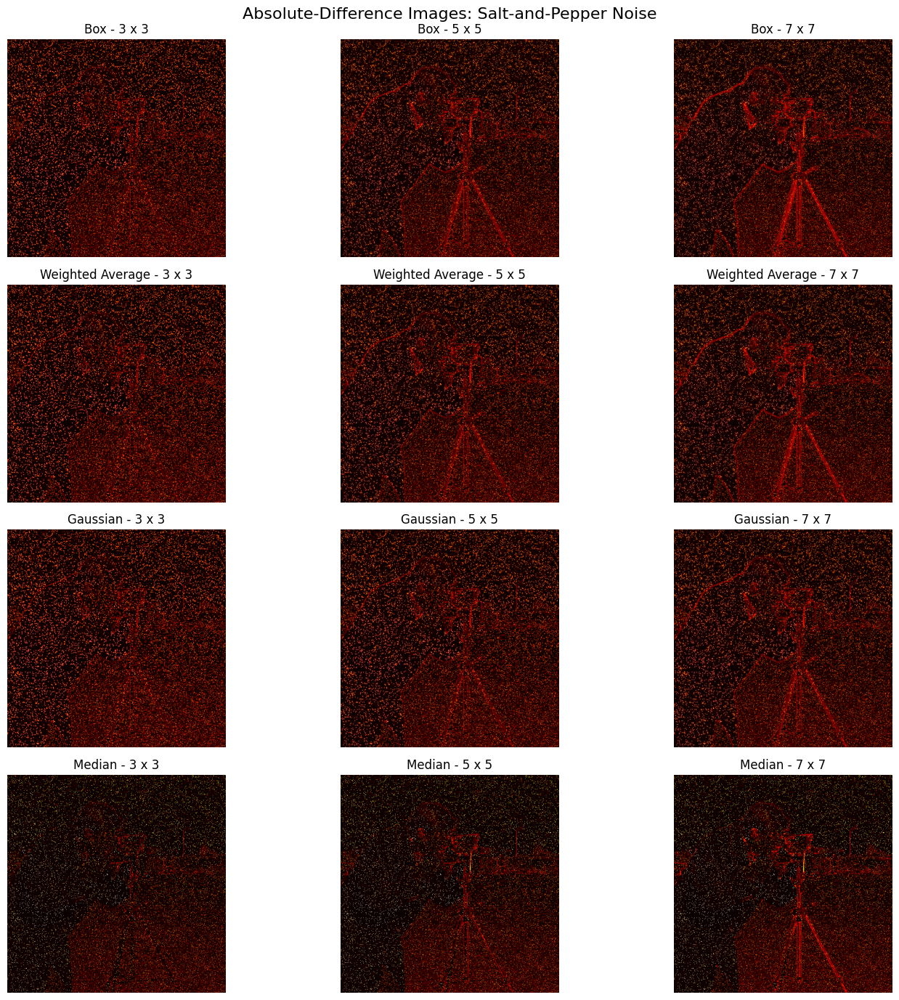

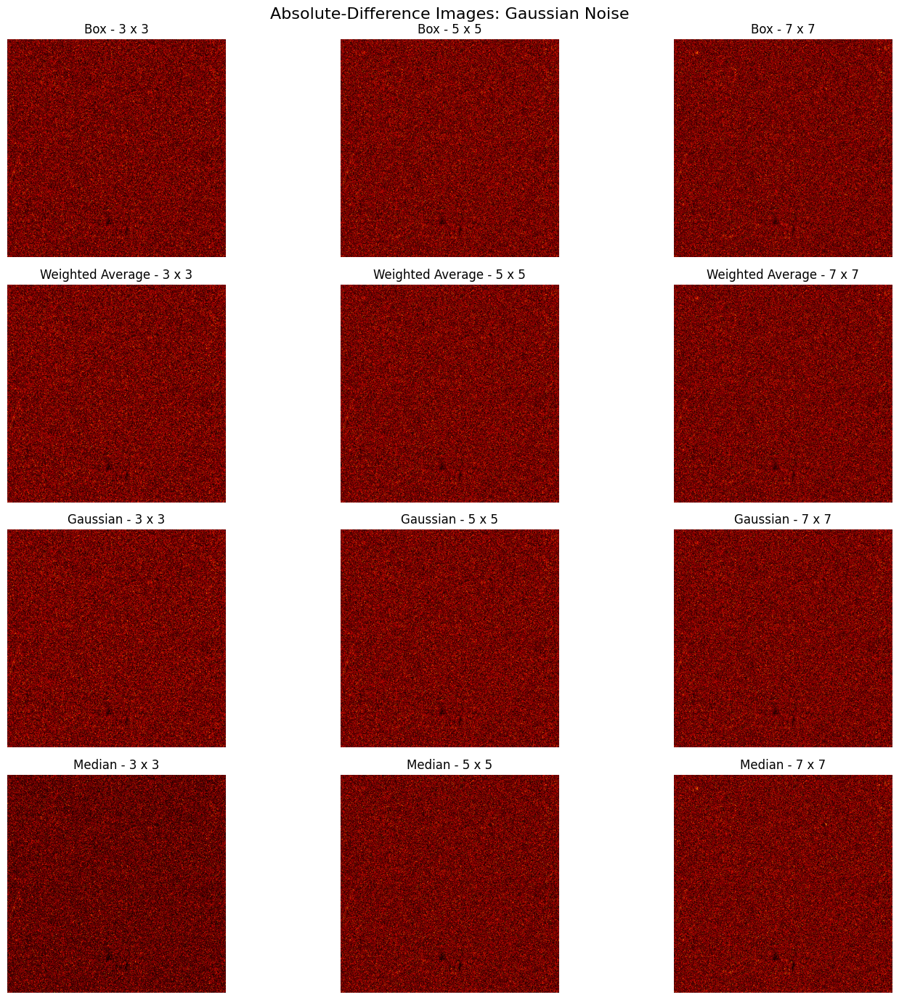

In [14]:
def show_difference_images(noisy_image, filtered_dict, title_prefix):

    plt.figure(figsize=(15, 14))

    for row, method in enumerate(methods):

        for col, k in enumerate(kernel_sizes):

            filtered = filtered_dict[(method, k)]

            difference = np.abs(
                noisy_image - filtered
            )

            position = row * len(kernel_sizes) + col + 1

            plt.subplot(
                len(methods),
                len(kernel_sizes),
                position
            )

            plt.imshow(
                difference,
                cmap="hot"
            )

            plt.title(f"{method} - {k} x {k}")
            plt.axis("off")

    plt.suptitle(
        f"Absolute-Difference Images: {title_prefix}",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()


show_difference_images(
    sp_noisy,
    sp_filtered,
    "Salt-and-Pepper Noise"
)

show_difference_images(
    gaussian_noisy,
    gaussian_filtered,
    "Gaussian Noise"
)

# 11. Create a Single Mixed-Noise Image

The left half contains salt-and-pepper noise and the right half contains Gaussian noise.

A single filter may not be optimal for both regions because different noise models respond differently to smoothing methods.


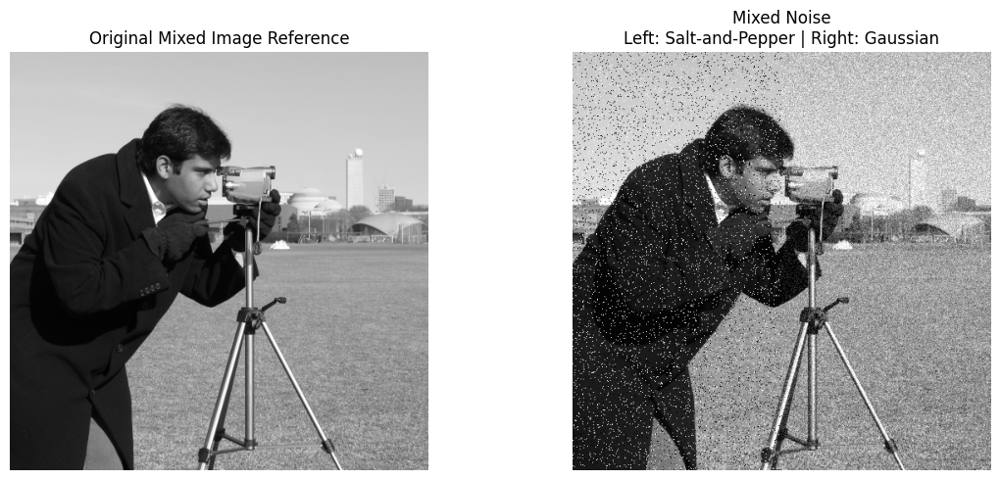

In [15]:
# Use the fine-detail image as the base image
mixed_original = fine_image.copy()

mid = mixed_original.shape[1] // 2

# Create two different noisy versions
left_noisy = add_salt_pepper_noise(
    mixed_original[:, :mid],
    amount=0.08
)

right_noisy = add_gaussian_noise(
    mixed_original[:, mid:],
    sigma=25
)

mixed_noisy = mixed_original.copy()

mixed_noisy[:, :mid] = left_noisy
mixed_noisy[:, mid:] = right_noisy


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(
    mixed_original,
    cmap="gray",
    vmin=0,
    vmax=255
)
plt.title("Original Mixed Image Reference")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(
    mixed_noisy,
    cmap="gray",
    vmin=0,
    vmax=255
)
plt.title(
    "Mixed Noise\nLeft: Salt-and-Pepper | Right: Gaussian"
)
plt.axis("off")

plt.tight_layout()
plt.show()

# 12. Apply All Four Filters to the Complete Mixed-Noise Image

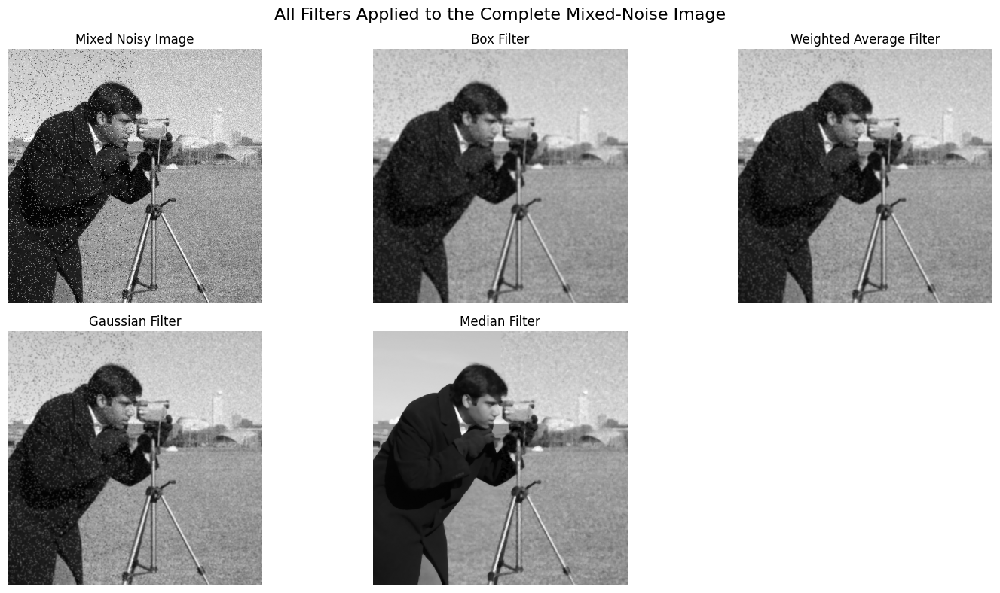

In [17]:
mixed_filtered = {}

# Use 5 x 5 as the representative common kernel size
mixed_kernel_size = 5

mixed_filtered["Box"] = box_filter(
    mixed_noisy,
    mixed_kernel_size
)

mixed_filtered["Weighted Average"] = (
    manual_weighted_average_filter(
        mixed_noisy,
        mixed_kernel_size
    )
)

mixed_filtered["Gaussian"] = gaussian_filter(
    mixed_noisy,
    mixed_kernel_size
)

mixed_filtered["Median"] = median_filter(
    mixed_noisy,
    mixed_kernel_size
)


plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.imshow(
    mixed_noisy,
    cmap="gray",
    vmin=0,
    vmax=255
)
plt.title("Mixed Noisy Image")
plt.axis("off")

for index, method in enumerate(methods):

    plt.subplot(2, 3, index + 2)

    plt.imshow(
        mixed_filtered[method],
        cmap="gray",
        vmin=0,
        vmax=255
    )

    plt.title(f"{method} Filter")
    plt.axis("off")

plt.suptitle(
    "All Filters Applied to the Complete Mixed-Noise Image",
    fontsize=16
)

plt.tight_layout()
plt.show()

# 13. Evaluate Each Filter Separately on the Left and Right Halves

This determines whether one filter performs best over the entire image.


In [18]:
mixed_results = []

for method, filtered in mixed_filtered.items():

    # Left half: Salt-and-pepper noise
    left_original = mixed_original[:, :mid]
    left_filtered = filtered[:, :mid]

    left_mse = calculate_mse(
        left_original,
        left_filtered
    )

    left_psnr = calculate_psnr(
        left_original,
        left_filtered
    )

    # Right half: Gaussian noise
    right_original = mixed_original[:, mid:]
    right_filtered = filtered[:, mid:]

    right_mse = calculate_mse(
        right_original,
        right_filtered
    )

    right_psnr = calculate_psnr(
        right_original,
        right_filtered
    )

    full_mse = calculate_mse(
        mixed_original,
        filtered
    )

    full_psnr = calculate_psnr(
        mixed_original,
        filtered
    )

    mixed_results.append({
        "Filter": method,
        "Left MSE": left_mse,
        "Left PSNR": left_psnr,
        "Right MSE": right_mse,
        "Right PSNR": right_psnr,
        "Full MSE": full_mse,
        "Full PSNR": full_psnr
    })


try:
    import pandas as pd
    mixed_results_df = pd.DataFrame(mixed_results)
    display(mixed_results_df)
except Exception:
    for row in mixed_results:
        print(row)

,Filter,Left MSE,Left PSNR,Right MSE,Right PSNR,Full MSE,Full PSNR
0,Box,207.489287,24.960847,220.289764,24.700860,213.889526,24.828908
1,Weighted Average,200.604562,25.107396,182.113824,25.527374,191.359193,25.312310
2,Gaussian,230.708770,24.500163,154.252990,26.248468,192.480880,25.286928
3,Median,55.058861,30.722531,206.020714,24.991695,130.539787,26.973375


# 14. Region-Wise Smoothing

A region-wise method applies a different filter to each half:

- **Left half:** Median filter, generally suitable for salt-and-pepper noise.
- **Right half:** Gaussian or Weighted-average filter, selected based on the measured results.

The code automatically chooses the best filter for the right half based on the lowest MSE from the previous comparison.


Best filter for right (Gaussian-noise) half: Gaussian


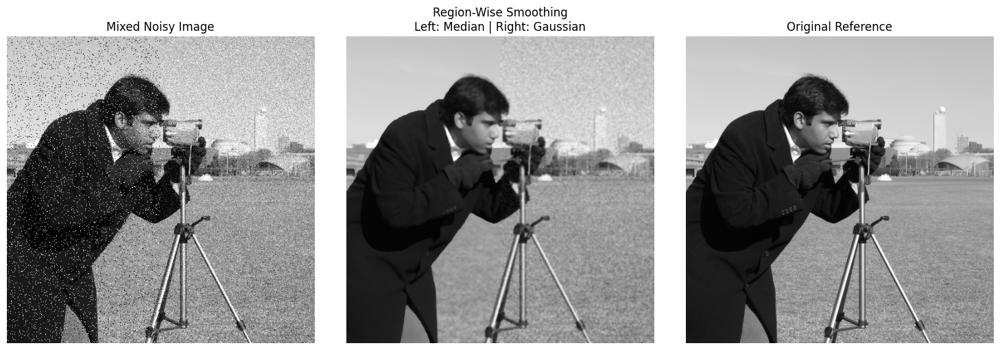

In [19]:
# Select the best filter for the right half using minimum MSE
best_right = min(
    mixed_results,
    key=lambda row: row["Right MSE"]
)

best_right_filter = best_right["Filter"]

print(
    "Best filter for right (Gaussian-noise) half:",
    best_right_filter
)


# Median filter for salt-and-pepper region
left_region_filtered = median_filter(
    mixed_noisy[:, :mid],
    mixed_kernel_size
)


# Apply selected best filter to right region
right_region = mixed_noisy[:, mid:]

if best_right_filter == "Box":
    right_region_filtered = manual_box_filter(
        right_region,
        mixed_kernel_size
    )

elif best_right_filter == "Weighted Average":
    right_region_filtered = manual_weighted_average_filter(
        right_region,
        mixed_kernel_size
    )

elif best_right_filter == "Gaussian":
    right_region_filtered = gaussian_filter(
        right_region,
        mixed_kernel_size
    )

else:
    right_region_filtered = median_filter(
        right_region,
        mixed_kernel_size
    )


# Combine both filtered halves
region_wise_filtered = np.zeros_like(
    mixed_noisy,
    dtype=np.float64
)

region_wise_filtered[:, :mid] = left_region_filtered
region_wise_filtered[:, mid:] = right_region_filtered


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(
    mixed_noisy,
    cmap="gray",
    vmin=0,
    vmax=255
)
plt.title("Mixed Noisy Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(
    region_wise_filtered,
    cmap="gray",
    vmin=0,
    vmax=255
)
plt.title(
    f"Region-Wise Smoothing\n"
    f"Left: Median | Right: {best_right_filter}"
)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(
    mixed_original,
    cmap="gray",
    vmin=0,
    vmax=255
)
plt.title("Original Reference")
plt.axis("off")

plt.tight_layout()
plt.show()

# 15. Compare Region-Wise Smoothing with Single-Filter Smoothing

In [20]:
region_wise_mse = calculate_mse(
    mixed_original,
    region_wise_filtered
)

region_wise_psnr = calculate_psnr(
    mixed_original,
    region_wise_filtered
)

comparison_results = []

for method, filtered in mixed_filtered.items():

    comparison_results.append({
        "Method": method,
        "MSE": calculate_mse(
            mixed_original,
            filtered
        ),
        "PSNR (dB)": calculate_psnr(
            mixed_original,
            filtered
        )
    })

comparison_results.append({
    "Method": "Region-Wise Smoothing",
    "MSE": region_wise_mse,
    "PSNR (dB)": region_wise_psnr
})


try:
    import pandas as pd
    comparison_df = pd.DataFrame(comparison_results)
    display(comparison_df)
except Exception:
    for row in comparison_results:
        print(row)

,Method,MSE,PSNR (dB)
0,Box,213.889526,24.828908
1,Weighted Average,191.359193,25.312310
2,Gaussian,192.480880,25.286928
3,Median,130.539787,26.973375
4,Region-Wise Smoothing,104.717870,27.930596


# 16. Automatically Identify the Best Filters

The best filter for each noise type is identified using the lowest MSE and highest PSNR.


In [21]:
sp_results = [
    row for row in results
    if row["Noise Type"] == "Salt-and-Pepper"
]

gaussian_results = [
    row for row in results
    if row["Noise Type"] == "Gaussian"
]


best_sp = min(
    sp_results,
    key=lambda row: row["MSE"]
)

best_gaussian = min(
    gaussian_results,
    key=lambda row: row["MSE"]
)


print("BEST FOR SALT-AND-PEPPER NOISE")
print("--------------------------------")
print("Filter:", best_sp["Filter"])
print("Kernel:", best_sp["Kernel Size"])
print("MSE:", best_sp["MSE"])
print("PSNR:", best_sp["PSNR (dB)"])


print("\nBEST FOR GAUSSIAN NOISE")
print("------------------------")
print("Filter:", best_gaussian["Filter"])
print("Kernel:", best_gaussian["Kernel Size"])
print("MSE:", best_gaussian["MSE"])
print("PSNR:", best_gaussian["PSNR (dB)"])

BEST FOR SALT-AND-PEPPER NOISE
--------------------------------
Filter: Median
Kernel: 3 x 3
MSE: 68.31693267822266
PSNR: 29.785520018817323

BEST FOR GAUSSIAN NOISE
------------------------
Filter: Weighted Average
Kernel: 7 x 7
MSE: 25.802586926893383
PSNR: 34.014171110382684


# 17. Final Results and Recommendations

## Salt-and-Pepper Noise

Salt-and-pepper noise consists of isolated extreme pixels. The **Median filter** is generally expected to perform well because it removes isolated outliers without averaging them into neighbouring pixels.

Box, Weighted-average, and Gaussian filters can spread the extreme black/white values into nearby pixels, causing additional blur.

## Gaussian Noise

Gaussian noise is distributed continuously across the image. **Gaussian filtering** and **Weighted-average filtering** are generally suitable because averaging reduces random variations.

The exact best filter and kernel size should be selected from the calculated MSE and PSNR values.

## Effect of Increasing Kernel Size

Increasing the kernel size generally:
- Removes more noise.
- Produces greater smoothing.
- Increases edge blurring.
- Causes greater loss of fine details.

Therefore, a larger kernel is not always better. The selected kernel should provide a suitable trade-off between noise reduction and detail preservation.

## Mixed-Noise Image

No single filter is guaranteed to perform best over the complete mixed-noise image because the left and right halves have different noise distributions.

A **region-wise smoothing approach** can outperform a single global filter by applying:
- Median filtering to the salt-and-pepper region.
- The experimentally best averaging/Gaussian-based filter to the Gaussian-noise region.

## Overall Recommendation

Use the numerical MSE/PSNR table together with visual inspection. In general:
- **Salt-and-pepper noise:** Median filter is recommended.
- **Gaussian noise:** Gaussian or Weighted-average filter is recommended.
- **Mixed noise:** Region-wise adaptive filtering is recommended.
